# Recurrent Neural Networks for Stock Price Prediction

* RNN
* LSTM
* GRU

In [1]:
!pip install pandas_market_calendars
# Import libraries.
import kagglehub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pandas_market_calendars as mcal
import random
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchmetrics.functional import r2_score

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.1/108.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.8/196.8 kB 6.5 MB/s eta 0:00:00


In [2]:
seed = 42
np.random.seed(seed)

# Set seed for PyTorch.
torch.manual_seed(seed)

# Set seed for inbuilt random function.
random.seed(seed)

# Use Metal GPU.
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# Increase DPI for plots.
plt.rcParams['figure.dpi'] = 500

In [3]:
# Download and load the dataset
base_path = kagglehub.dataset_download("rahulsah06/gooogle-stock-price")
train_path = f"{base_path}/Google_Stock_Price_Train.csv"
test_path = f"{base_path}/Google_Stock_Price_Test.csv"
df = pd.read_csv(train_path)
df_test = pd.read_csv(test_path)

## Exploratory Data Analysis & Data Pre-processing

In [4]:
# Convert date to month/date/year format.
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
df_test['Date'] = pd.to_datetime(df_test['Date'], format='%m/%d/%Y')
df.head(n=15)

,Date,Open,High,Low,Close,Volume
0,2012-01-03,325.25,332.83,324.97,663.59,"7,380,500"
1,2012-01-04,331.27,333.87,329.08,666.45,"5,749,400"
2,2012-01-05,329.83,330.75,326.89,657.21,"6,590,300"
3,2012-01-06,328.34,328.77,323.68,648.24,"5,405,900"
4,2012-01-09,322.04,322.29,309.46,620.76,"11,688,800"
5,2012-01-10,313.70,315.72,307.30,621.43,"8,824,000"
6,2012-01-11,310.59,313.52,309.40,624.25,"4,817,800"
7,2012-01-12,314.43,315.26,312.08,627.92,"3,764,400"
8,2012-01-13,311.96,312.30,309.37,623.28,"4,631,800"
9,2012-01-17,314.81,314.81,311.67,626.86,"3,832,800"


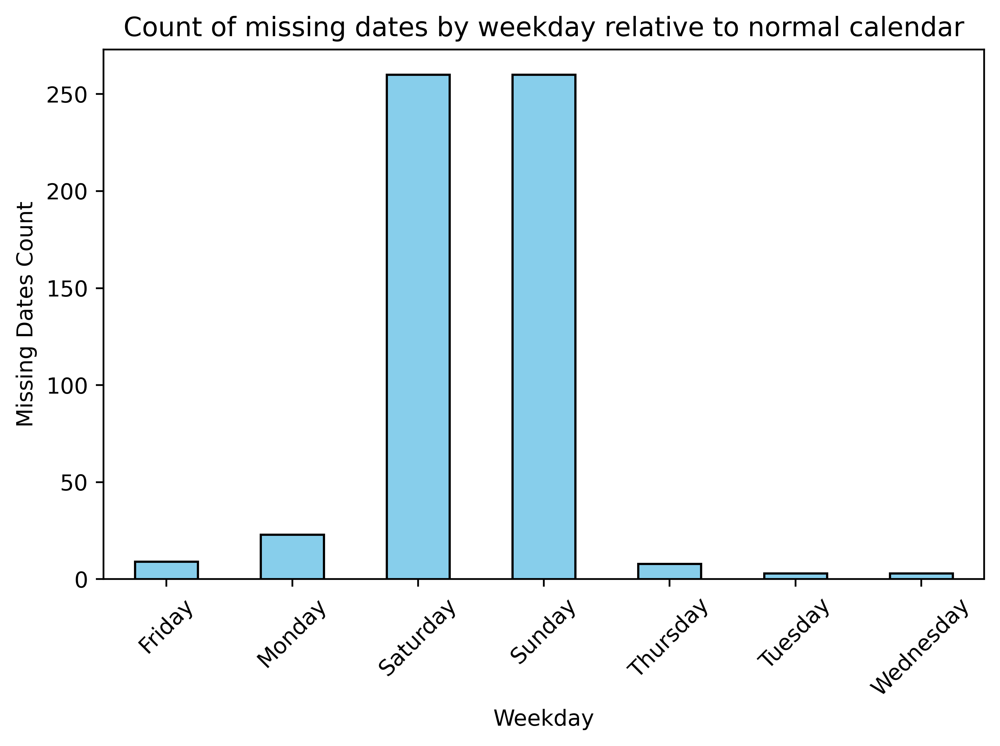

In [5]:
# Count the missing dates
full_date_range = pd.date_range(start=df['Date'].min(), end=df['Date'].max())
missing_dates = full_date_range.difference(df['Date'])
missing_dates_df = pd.DataFrame({'Date': missing_dates})
missing_dates_df['Weekday'] = missing_dates_df['Date'].dt.day_name()

# Count missing dates by weekday
weekday_counts = missing_dates_df['Weekday'].value_counts()

# Plot the counts in a bar chart
weekday_counts.sort_index(inplace=True)  # Sort by weekday order
weekday_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Count of missing dates by weekday relative to normal calendar')
plt.xlabel('Weekday')
plt.ylabel('Missing Dates Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [6]:
# Count the missing dates relative to the financial calendar.
nyse = mcal.get_calendar('NYSE')
schedule = nyse.schedule(start_date=df['Date'].min(), end_date=df['Date'].max())

# Generate a list of valid market days
valid_market_days = schedule.index

# Identify missing market days
missing_market_days = valid_market_days.difference(df['Date'])

# Convert to DataFrame for analysis
missing_days_df = pd.DataFrame({'Missing Dates': missing_market_days})
missing_days_df['Weekday'] = missing_days_df['Missing Dates'].dt.day_name()

# Output
print("Missing Market Days:")
print(missing_days_df)

Missing Market Days:
Empty DataFrame
Columns: [Missing Dates, Weekday]
Index: []


### Implication of missing dates
- When comparing the continuity of dates with the normal calendar, some dates are missing. However, it matches with the financial calendar.
- Some dates are missing since the financial market is closed on weekends and public holidays.
- These dates can be backfilled with data from previous dates.
- While predicting, additional checks are essential to account for market holidays.

In [7]:
# Backfill missing dates data.
# Set 'Date' as index
df.set_index('Date', inplace=True)

# Generate the complete date range
full_date_range = pd.date_range(start=df.index.min(), end=df.index.max())

# Reindex the DataFrame to include all dates
df = df.reindex(full_date_range)

# Backfill missing rows with the previous day's data
df = df.bfill()

# Reset the index and rename columns
df.reset_index(inplace=True)
df.rename(columns={'index': 'Date'}, inplace=True)


In [8]:
df_test.set_index('Date', inplace=True)

# Generate the complete date range
full_date_range = pd.date_range(start=df_test.index.min(), end=df_test.index.max())

# Reindex the DataFrame to include all dates
df_test = df_test.reindex(full_date_range)

# Backfill missing rows with the previous day's data
df_test = df_test.bfill()

# Reset the index and rename columns
df_test.reset_index(inplace=True)
df_test.rename(columns={'index': 'Date'}, inplace=True)

In [9]:
df.head(n=15)

,Date,Open,High,Low,Close,Volume
0,2012-01-03,325.25,332.83,324.97,663.59,"7,380,500"
1,2012-01-04,331.27,333.87,329.08,666.45,"5,749,400"
2,2012-01-05,329.83,330.75,326.89,657.21,"6,590,300"
3,2012-01-06,328.34,328.77,323.68,648.24,"5,405,900"
4,2012-01-07,322.04,322.29,309.46,620.76,"11,688,800"
5,2012-01-08,322.04,322.29,309.46,620.76,"11,688,800"
6,2012-01-09,322.04,322.29,309.46,620.76,"11,688,800"
7,2012-01-10,313.70,315.72,307.30,621.43,"8,824,000"
8,2012-01-11,310.59,313.52,309.40,624.25,"4,817,800"
9,2012-01-12,314.43,315.26,312.08,627.92,"3,764,400"


In [10]:
df.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close             object
Volume            object
dtype: object

In [11]:
df_test.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume            object
dtype: object

### Data type inference
- Need to convert Close and Volume columns to float data type for computation.

In [12]:
df['Close'] = df['Close'].apply(lambda x : x.replace(',', '')).astype('float')
df['Volume'] = df['Volume'].apply(lambda x : x.replace(',', '')).astype('float')
df_test['Volume'] = df_test['Volume'].apply(lambda x : x.replace(',', '')).astype('float')

In [13]:
df.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume           float64
dtype: object

In [14]:
df_test.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume           float64
dtype: object

### Data visualisation

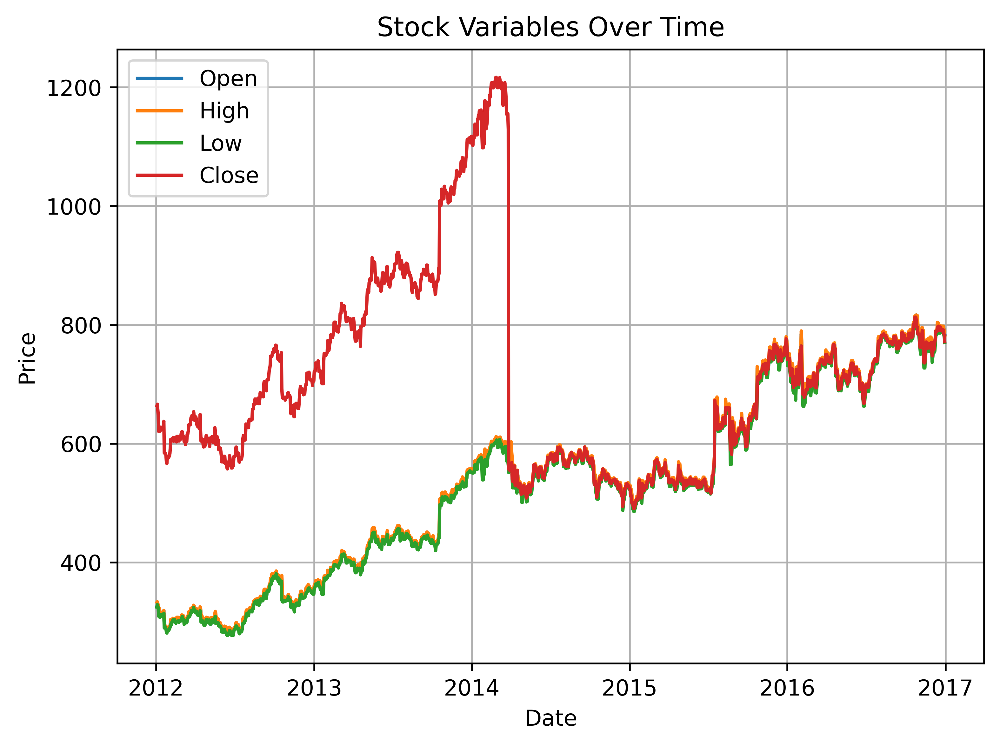

In [15]:
for column in df.drop(['Date', 'Volume'], axis=1).columns:
    plt.plot(df['Date'], df[column], label=column)

# Customize the plot
plt.title('Stock Variables Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='upper left')
plt.grid()
plt.tight_layout()

plt.show()

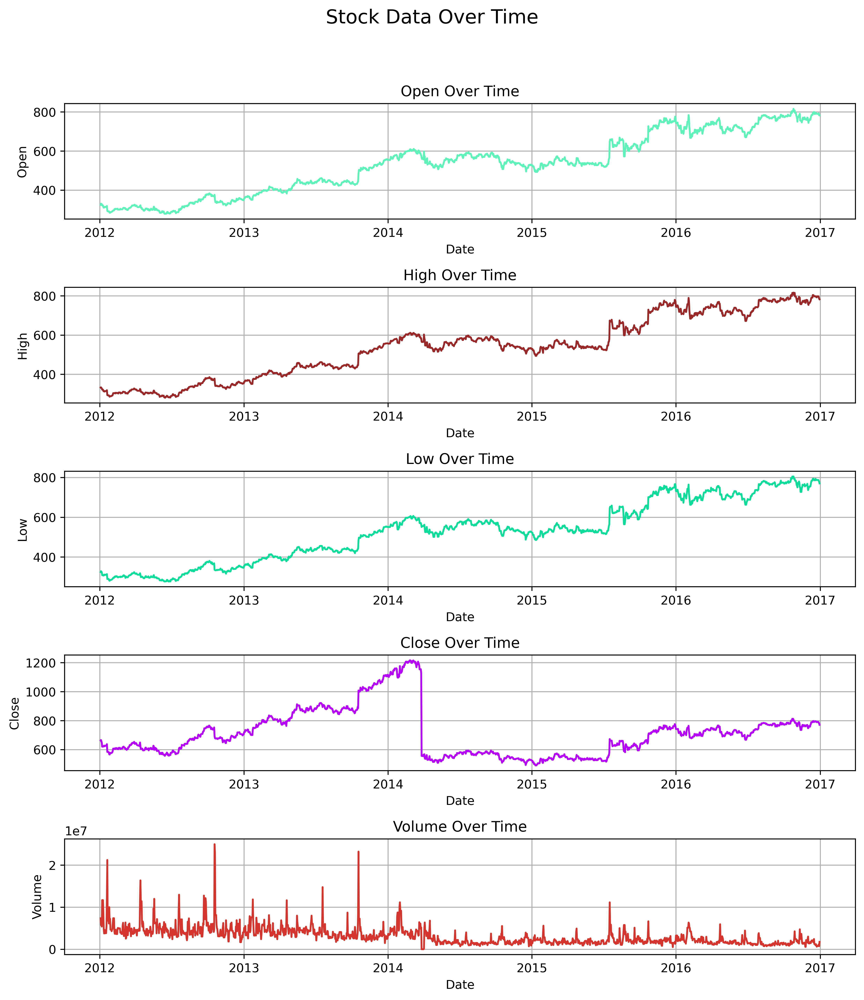

In [16]:
# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 12), sharex=False)

# Plot each variable
variables = ['Open', 'High', 'Low', 'Close', 'Volume']
for i, var in enumerate(variables):
    axes[i].plot(df['Date'], df[var], label=var, color=np.random.rand(3,))
    axes[i].set_title(f'{var} Over Time')
    axes[i].set_ylabel(var)
    axes[i].grid(True)
    axes[i].set_xlabel('Date')

# Set common labels
fig.suptitle('Stock Data Over Time', fontsize=16)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

- Open, High, and Low variables have a similar pattern
- The pattern of the Close variable deviates around the year 2014.
- Volume variable has a fluctuating pattern.

### Data distribution

In [17]:
df.describe()

,Date,Open,High,Low,Close,Volume
count,1824,1824.000000,1824.000000,1824.000000,1824.000000,1.824000e+03
mean,2014-07-02 12:00:00,533.072083,537.340543,528.480729,712.720367,3.106657e+06
min,2012-01-03 00:00:00,279.120000,281.210000,277.220000,491.200000,7.900000e+03
25%,2013-04-02 18:00:00,401.150000,406.047500,400.000000,576.920000,1.600625e+06
50%,2014-07-02 12:00:00,537.135000,540.675000,532.400000,695.160000,2.529300e+06
75%,2015-10-01 06:00:00,654.747500,661.380000,644.400000,781.760000,4.097750e+06
max,2016-12-30 00:00:00,816.680000,816.680000,805.140000,1216.830000,2.497790e+07
std,NaN,151.733497,152.865305,150.459229,165.090467,2.144911e+06


- The data need to be normalised for uniformity across all variables.
- The date variable cannot be used as is. It can be transformed to timestamp.

In [18]:
df['Timestamp'] = df['Date'].astype('int64') // 10**9
df_test['Timestamp'] = df_test['Date'].astype('int64') // 10**9

In [19]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_df = scaler.fit_transform(df.drop('Date', axis=1).values)
scaled_df_test = scaler.transform(df_test.drop('Date', axis=1).values)

### Convert data to sequence

In [20]:
# Function to create dataset with time steps
def create_dataset(data, time_step=10):
    X, y = [], []
    for i in range(time_step, len(data)):
        X.append(data[i-time_step:i])
        y.append(data[i])
    return np.array(X), np.array(y)

# Create datasets
X_train, y_train = create_dataset(scaled_df)
X_test, y_test = create_dataset(scaled_df_test)

features = df.drop('Date', axis=1).columns

In [21]:
# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

## Modeling

In [22]:
# Model definitions
class RNNModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(RNNModel, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, hidden_size // 2)
        self.fc2 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.fc3 = nn.Linear(hidden_size // 4, output_size)
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.001)
        self.batch_norm1 = nn.BatchNorm1d(hidden_size)
        self.batch_norm2 = nn.BatchNorm1d(hidden_size // 2)
        self.batch_norm3 = nn.BatchNorm1d(hidden_size // 4)
    
    def forward(self, x):
        out, _ = self.rnn(x)
        out = out[:, -1, :]
        out = self.fc1(self.leaky_relu(self.batch_norm1(out)))
        out = self.fc2(self.leaky_relu(self.batch_norm2(out)))
        out = self.fc3(self.leaky_relu(self.batch_norm3(out)))
        return out

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, hidden_size // 2)
        self.fc2 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.fc3 = nn.Linear(hidden_size // 4, output_size)
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.001)
        self.batch_norm1 = nn.BatchNorm1d(hidden_size)
        self.batch_norm2 = nn.BatchNorm1d(hidden_size // 2)
        self.batch_norm3 = nn.BatchNorm1d(hidden_size // 4)
    
    
    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        out = self.fc1(self.leaky_relu(self.batch_norm1(out)))
        out = self.fc2(self.leaky_relu(self.batch_norm2(out)))
        out = self.fc3(self.leaky_relu(self.batch_norm3(out)))
        return out

class GRUModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(GRUModel, self).__init__()
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, hidden_size // 2)
        self.fc2 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.fc3 = nn.Linear(hidden_size // 4, output_size)
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.001)
        self.batch_norm1 = nn.BatchNorm1d(hidden_size)
        self.batch_norm2 = nn.BatchNorm1d(hidden_size // 2)
        self.batch_norm3 = nn.BatchNorm1d(hidden_size // 4)
    
    def forward(self, x):
        out, _ = self.gru(x)
        out = out[:, -1, :]
        out = self.fc1(self.leaky_relu(self.batch_norm1(out)))
        out = self.fc2(self.leaky_relu(self.batch_norm2(out)))
        out = self.fc3(self.leaky_relu(self.batch_norm3(out)))
        return out


In [23]:
# Train and evaluate model with cross-validation
def train_model(model_class, model_name, params, X, y, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    results = []
    train_losses, val_losses = [], []
    best_models = []
    
    for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
        print(f"\nTraining {model_name} - Hidden Size: {params['hidden_size']}, "
              f"Num Layers: {params['num_layers']}, Learning Rate: {params['learning_rate']} - Fold {fold + 1}")

        train_X, val_X = X[train_idx], X[val_idx]
        train_y, val_y = y[train_idx], y[val_idx]

        model = model_class(input_size=len(features), hidden_size=params['hidden_size'], 
                            num_layers=params['num_layers'], output_size=len(features))
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=params['learning_rate'])

        best_val_loss = float('inf')
        early_stop_count = 0
        fold_train_loss, fold_val_loss = [], []

        for epoch in range(1000):
            model.train()
            optimizer.zero_grad()
            output = model(train_X)
            loss = criterion(output, train_y)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            fold_train_loss.append(loss.item())

            model.eval()
            with torch.no_grad():
                val_output = model(val_X)
                val_loss = criterion(val_output, val_y).item()
                fold_val_loss.append(val_loss)

            # Print training progress
            if (epoch+1)%10==0:
                print(f"    Epoch {epoch+1}: Train Loss: {loss.item():.4f}, Val Loss: {val_loss:.4f}")

            # Early stopping and saving best model
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_model_state = model.state_dict()  # Save the best model weights
                early_stop_count = 0
            else:
                early_stop_count += 1

            if early_stop_count > 10:
                print(f"    Early stopping at epoch {epoch+1}")
                break

        train_losses.append(fold_train_loss)
        val_losses.append(fold_val_loss)
        val_rmse = np.sqrt(best_val_loss)
        results.append({'Fold': fold + 1, 'Val_RMSE': val_rmse})
        best_models.append(best_model_state)

    return results, train_losses, val_losses, best_models


In [24]:
# Hyperparameter grid
hidden_sizes = [64, 128, 256]
num_layers_list = [1, 2, 3]
learning_rates = [0.01, 0.001, 0.0001]

# Store results
final_results = []

for model_class, model_name in zip([RNNModel, LSTMModel, GRUModel], ['RNN', 'LSTM', 'GRU']):
    for hidden_size in hidden_sizes:
        for num_layers in num_layers_list:
            for lr in learning_rates:
                params = {'hidden_size': hidden_size, 'num_layers': num_layers, 'learning_rate': lr}
                results, train_losses, val_losses, best_models = train_model(model_class, model_name, params, X_train, y_train)
                avg_rmse = np.mean([r['Val_RMSE'] for r in results])
                final_results.append({
                    'Model': model_name,
                    'Hidden_Size': hidden_size,
                    'Num_Layers': num_layers,
                    'Learning_Rate': lr,
                    'Avg_Val_RMSE': avg_rmse,
                    'Best_Models': best_models,
                    'Train_Loss': train_losses,
                    'Val_Loss': val_losses
                })

# Store results in a DataFrame
results_df = pd.DataFrame(final_results)


Training RNN - Hidden Size: 64, Num Layers: 1, Learning Rate: 0.01 - Fold 1
    Epoch 10: Train Loss: 0.0192, Val Loss: 0.0575
    Epoch 20: Train Loss: 0.0118, Val Loss: 0.0618
    Epoch 30: Train Loss: 0.0035, Val Loss: 0.0320
    Epoch 40: Train Loss: 0.0025, Val Loss: 0.0226
    Epoch 50: Train Loss: 0.0016, Val Loss: 0.0168
    Epoch 60: Train Loss: 0.0014, Val Loss: 0.0137
    Epoch 70: Train Loss: 0.0011, Val Loss: 0.0088
    Epoch 80: Train Loss: 0.0011, Val Loss: 0.0052
    Epoch 90: Train Loss: 0.0010, Val Loss: 0.0032
    Epoch 100: Train Loss: 0.0010, Val Loss: 0.0018
    Epoch 110: Train Loss: 0.0009, Val Loss: 0.0013
    Epoch 120: Train Loss: 0.0009, Val Loss: 0.0014
    Early stopping at epoch 124

Training RNN - Hidden Size: 64, Num Layers: 1, Learning Rate: 0.01 - Fold 2
    Epoch 10: Train Loss: 0.0349, Val Loss: 0.1104
    Epoch 20: Train Loss: 0.0150, Val Loss: 0.0204
    Epoch 30: Train Loss: 0.0053, Val Loss: 0.0320
    Early stopping at epoch 30

Training RNN -

In [25]:
results_df

,Model,Hidden_Size,Num_Layers,Learning_Rate,Avg_Val_RMSE,Best_Models,Train_Loss,Val_Loss
0,RNN,64,1,0.0100,0.126086,"[{'rnn.weight_ih_l0': [tensor([ 0.1174, 0.126...","[[0.3843449354171753, 0.28489723801612854, 0.1...","[[0.27390769124031067, 0.25005826354026794, 0...."
1,RNN,64,1,0.0010,0.033369,"[{'rnn.weight_ih_l0': [tensor([ 0.0868, 0.118...","[[0.3744231164455414, 0.32308799028396606, 0.2...","[[0.315311074256897, 0.31041020154953003, 0.30..."
2,RNN,64,1,0.0001,0.495404,"[{'rnn.weight_ih_l0': [tensor([ 0.0640, 0.095...","[[0.43359094858169556, 0.42420798540115356, 0....","[[0.26845645904541016, 0.264258474111557, 0.26..."
3,RNN,64,2,0.0100,0.180007,"[{'rnn.weight_ih_l0': [tensor([-0.1348, -0.140...","[[0.5544567704200745, 0.38128381967544556, 0.2...","[[0.27951329946517944, 0.24511012434959412, 0...."
4,RNN,64,2,0.0010,0.036352,"[{'rnn.weight_ih_l0': [tensor([-0.1151, 0.060...","[[0.4330953359603882, 0.33766448497772217, 0.3...","[[0.22151371836662292, 0.21891678869724274, 0...."
...,...,...,...,...,...,...,...,...
76,GRU,256,2,0.0010,0.029828,"[{'gru.weight_ih_l0': [tensor([ 0.0167, 0.026...","[[0.6038836240768433, 0.46318429708480835, 0.3...","[[0.25675535202026367, 0.2536493241786957, 0.2..."
77,GRU,256,2,0.0001,0.196159,"[{'gru.weight_ih_l0': [tensor([-0.0250, 0.016...","[[0.3885166347026825, 0.2914603650569916, 0.24...","[[0.23044438660144806, 0.22988064587116241, 0...."
78,GRU,256,3,0.0100,0.177697,"[{'gru.weight_ih_l0': [tensor([-0.0087, -0.021...","[[0.41696107387542725, 0.2719217836856842, 0.3...","[[0.16559195518493652, 0.1742068976163864, 0.0..."
79,GRU,256,3,0.0010,0.040510,"[{'gru.weight_ih_l0': [tensor([-0.0178, -0.042...","[[0.5058634877204895, 0.3239733576774597, 0.29...","[[0.22990840673446655, 0.23348280787467957, 0...."


## Testing

- Perform testing on Test data.

In [30]:
# Test each model and plot predictions
fig, axes = plt.subplots(len(features), 1, figsize=(20, 50), sharex=False, sharey=False)
intial_outs = X_test[0].reshape((1, *X_test[0].shape)).clone()
y_actual = torch.cat((intial_outs, torch.from_numpy(np.array([y_test]))), dim=1)
actual_prices = scaler.inverse_transform(y_actual[0].numpy())

final_results = []
for model_name, model_class in zip(['RNN', 'LSTM', 'GRU'], [RNNModel, LSTMModel, GRUModel]):
    # Filter the best parameters for this model
    model_results = results_df[results_df['Model'] == model_name]
    best_row = model_results.loc[model_results['Avg_Val_RMSE'].idxmin()]
    best_params = {
        'hidden_size': best_row['Hidden_Size'],
        'num_layers': best_row['Num_Layers'],
        'learning_rate': best_row['Learning_Rate']
    }
    best_weights = best_row['Best_Models'][0]  # Load the best model weights for the first fold
    
    # Initialize and load the model
    best_model = model_class(input_size=len(features), hidden_size=int(best_params['hidden_size']),
                             num_layers=int(best_params['num_layers']), output_size=len(features))
    best_model.load_state_dict(best_weights)
    
    # Evaluate on the test set
    best_model.eval()
    with torch.no_grad():
        test_output = best_model(X_test)
        test_output = torch.cat((intial_outs, torch.from_numpy(np.array([test_output]))), dim=1)
        predicted_prices = scaler.inverse_transform(test_output[0].numpy())
        
        
    
    # Calculate RMSE for test set
    criterion = nn.MSELoss()
    test_rmse = np.sqrt(criterion(test_output, y_actual).item())
    test_mae = torch.mean(np.abs(test_output-y_actual)).item()
    test_r2 = r2_score(test_output[0], y_actual[0]).item()
    print(f"Test RMSE for {model_name}: {test_rmse:.4f}")
    print(f"Test MAE for {model_name}: {test_mae:.4f}")
    print(f"Test R2 for {model_name}: {test_r2:.4f}")
    final_results.append({
        'Model': model_name,
        'Hidden size': best_row['Hidden_Size'],
        '#Layers': best_row['Num_Layers'],
        'Learning rate': best_row['Learning_Rate'],
        'Avg Val RMSE': best_row['Avg_Val_RMSE'],
        'Test RMSE': test_rmse,
        'Test MAE': test_mae,
        'Test R2': test_r2
    })
    # Plot the predictions
    for i in range(len(features)):
        axes[i].plot(df_test['Date'], predicted_prices[:, i], label=f'{model_name} Predictions (RMSE: {test_rmse:.4f})')
        if model_name == 'GRU':
            # Plot actual prices only on last plot
            axes[i].plot(df_test['Date'], actual_prices[:, i], label=f'Actual {features[i]}', color='blue', linewidth=2)
        axes[i].tick_params(axis='x', rotation=30)
        # Customize the plot
        axes[i].set_title(f'Test Data: Actual vs Predicted {features[i]} for RNN, LSTM, GRU')
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel(f'{features[i]}')
        axes[i].legend()
        axes[i].grid()
plt.show()


Test RMSE for RNN: 0.0221
Test MAE for RNN: 0.0154
Test R2 for RNN: -1.7449
Test RMSE for LSTM: 0.0155
Test MAE for LSTM: 0.0100
Test R2 for LSTM: -0.6788
Test RMSE for GRU: 0.0174
Test MAE for GRU: 0.0101
Test R2 for GRU: -0.6680


## Evaluation

In [31]:
fr = pd.DataFrame(final_results)
fr

,Model,Hidden size,#Layers,Learning rate,Avg Val RMSE,Test RMSE,Test MAE,Test R2
0,RNN,256,1,0.001,0.027713,0.022083,0.015369,-1.744853
1,LSTM,256,1,0.001,0.026553,0.015494,0.010033,-0.678795
2,GRU,256,1,0.001,0.026702,0.017447,0.010108,-0.668002


In [32]:
def square_matrix(matrix):
    """
    Convert sparse matrix to dense matrix.
    """
    max_length = max(len(row) for row in matrix)
    
    # Pad each row by duplicating the last element until it matches max_length
    for row in matrix:
        row.extend([row[-1]] * (max_length - len(row)))
    
    return matrix

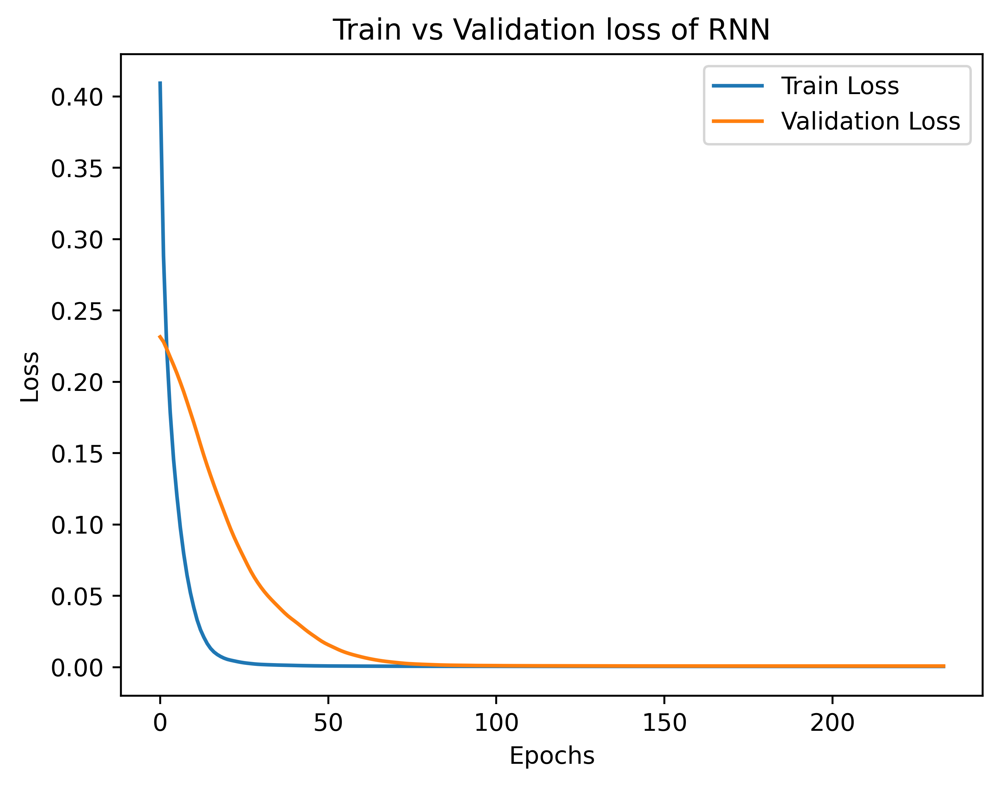

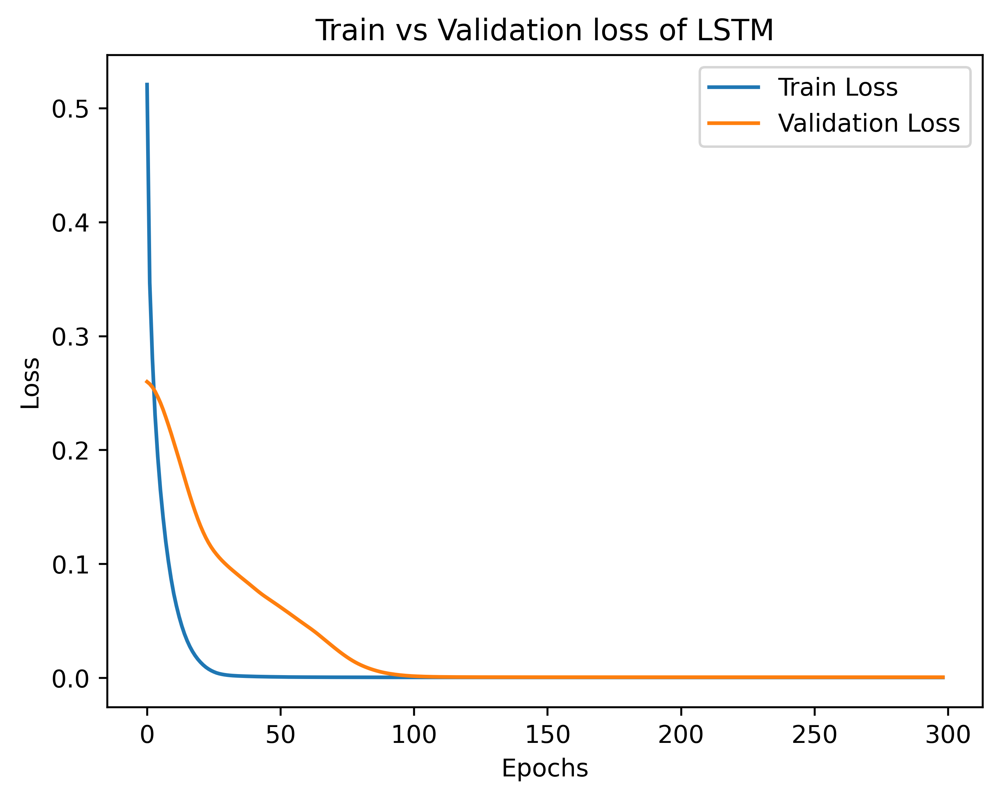

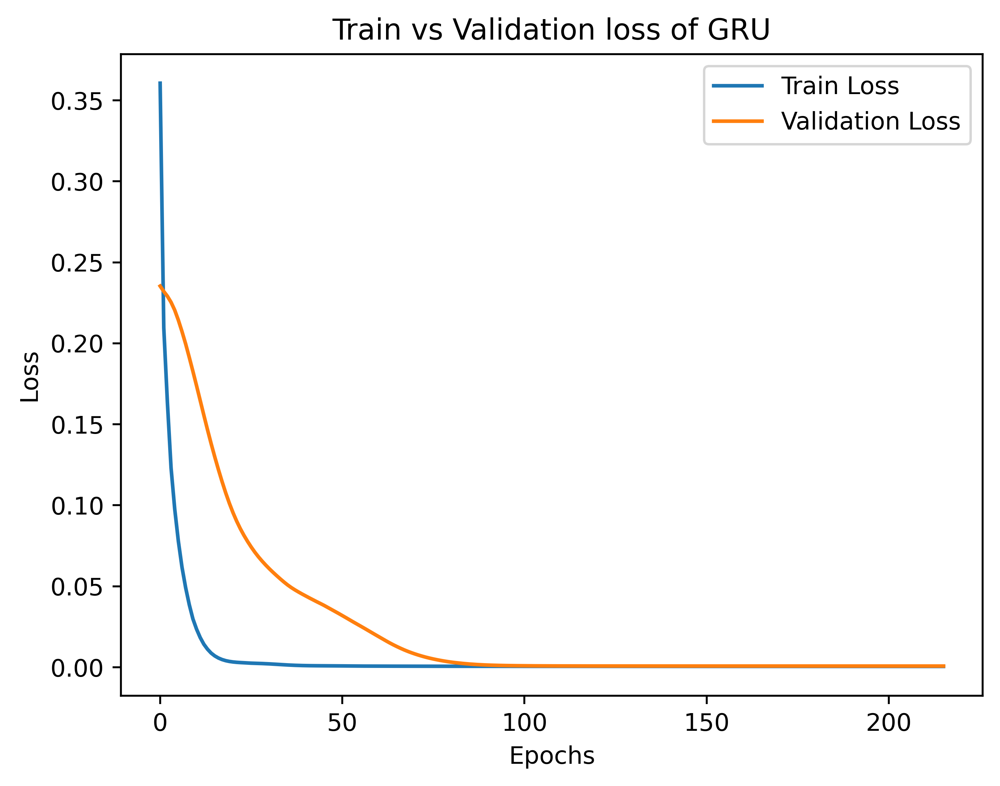

In [33]:
for model_name, model_class in zip(['RNN', 'LSTM', 'GRU'], [RNNModel, LSTMModel, GRUModel]):
    model_results = results_df[results_df['Model'] == model_name]
    best_row = model_results.loc[model_results['Avg_Val_RMSE'].idxmin()]
    train_loss = square_matrix(best_row['Train_Loss'])
    val_loss = square_matrix(best_row['Val_Loss'])
    train_loss = np.mean(train_loss, axis=0)
    val_loss = np.mean(val_loss, axis=0)
    epochs = range(train_loss.shape[0])
    plt.plot(epochs, train_loss, label="Train Loss")
    plt.plot(epochs, val_loss, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title(f"Train vs Validation loss of {model_name}")
    plt.show()

### Autoregression

- Generate output one by one

In [34]:
def auto_regression(model, data, y):
    """
    Function for autoregressive output
    """
    initial_sequence = data[0].reshape((1, *data[0].shape)).clone()
    auto_out = initial_sequence.clone()
    actual_out = initial_sequence.clone()
    current_sequence = initial_sequence.clone()
    for i in range(len(y)):
        out = model(current_sequence)
        out = torch.tensor(torch.from_numpy(np.array([out])))
        auto_out = torch.cat((auto_out, out), dim=1)
        current_sequence = torch.cat((current_sequence[:, 1:, :], out), dim=1)
        actual_out = torch.cat((actual_out, torch.from_numpy(np.array([[y[i]]]))), dim=1)
    # Return predicted and actual outputs
    return auto_out[0], actual_out[0]
    

In [37]:
fig, axes = plt.subplots(len(features), 1, figsize=(20, 50), sharex=False, sharey=False)
actual_prices = scaler.inverse_transform(y_test.numpy())
final_results_auto = []
actual_output = None
for model_name, model_class in zip(['RNN', 'LSTM', 'GRU'], [RNNModel, LSTMModel, GRUModel]):
    # Filter the best parameters for this model
    model_results = results_df[results_df['Model'] == model_name]
    best_row = model_results.loc[model_results['Avg_Val_RMSE'].idxmin()]
    best_params = {
        'hidden_size': best_row['Hidden_Size'],
        'num_layers': best_row['Num_Layers'],
        'learning_rate': best_row['Learning_Rate']
    }
    best_weights = best_row['Best_Models'][0]  # Load the best model weights for the first fold
    
    # Initialize and load the model
    best_model = model_class(input_size=len(features), hidden_size=int(best_params['hidden_size']),
                             num_layers=int(best_params['num_layers']), output_size=len(features))
    best_model.load_state_dict(best_weights)
    
    # Evaluate on the test set
    
    best_model.eval()
    with torch.no_grad():
        # Autoregression
        test_output, actual_output = auto_regression(best_model, X_test, y_test)
        predicted_prices = scaler.inverse_transform(test_output.numpy())
        actual_prices = scaler.inverse_transform(actual_output.numpy())
    
    # Calculate RMSE for test set
    criterion = nn.MSELoss()
    test_rmse = np.sqrt(criterion(test_output, actual_output).item())
    test_mae = torch.mean(np.abs(test_output-actual_output)).item()
    test_r2 = r2_score(test_output, actual_output).item()
    print(f"Test RMSE for {model_name}: {test_rmse:.4f}")
    print(f"Test MAE for {model_name}: {test_mae:.4f}")
    print(f"Test R2 for {model_name}: {test_r2:.4f}")
    final_results_auto.append({
        'Model': model_name,
        'Hidden size': best_row['Hidden_Size'],
        '#Layers': best_row['Num_Layers'],
        'Learning rate': best_row['Learning_Rate'],
        'Avg Val RMSE': best_row['Avg_Val_RMSE'],
        'Autoregressive Test RMSE': test_rmse,
        'Autoregressive Test MAE': test_mae,
        'Autoregressive Test R2': test_r2
    })
    # Plot the predictions
    for i in range(len(features)):
        axes[i].plot(df_test['Date'], predicted_prices[:, i], label=f'{model_name} Predictions (RMSE: {test_rmse:.4f})')
        
    
        # Plot actual prices
        if model_name == 'GRU': # Show actual values on the last plot
            axes[i].plot(df_test['Date'], actual_prices[:, i], label=f'Actual {features[i]}', color='blue', linewidth=2)
        
        # Customize the plot
        axes[i].set_title(f'Test Data: Actual vs Predicted {features[i]} for RNN, LSTM, GRU via Autoregression')
        axes[i].set_xlabel('Date')
        axes[i].tick_params(axis='x', rotation=30)
        axes[i].set_ylabel(f'{features[i]}')
        axes[i].legend()
        axes[i].grid()
plt.show()


/tmp/ipykernel_24/1607493209.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.tensor(torch.from_numpy(np.array([out])))
/tmp/ipykernel_24/1607493209.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.tensor(torch.from_numpy(np.array([out])))
/tmp/ipykernel_24/1607493209.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.tensor(torch.from_numpy(np.array([out])))


Test RMSE for RNN: 0.1184
Test MAE for RNN: 0.0796
Test R2 for RNN: -46.3560
Test RMSE for LSTM: 0.2482
Test MAE for LSTM: 0.1087
Test R2 for LSTM: -983.3432
Test RMSE for GRU: 0.0656
Test MAE for GRU: 0.0394
Test R2 for GRU: -12.5287


In [38]:
fr_auto = pd.DataFrame(final_results_auto)
fr_auto

,Model,Hidden size,#Layers,Learning rate,Avg Val RMSE,Autoregressive Test RMSE,Autoregressive Test MAE,Autoregressive Test R2
0,RNN,256,1,0.001,0.027713,0.118352,0.079621,-46.356022
1,LSTM,256,1,0.001,0.026553,0.248177,0.108749,-983.343201
2,GRU,256,1,0.001,0.026702,0.065633,0.039437,-12.528674
